In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
import addict
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

import celeri

# Read data and pre-process

In [3]:
COMMAND_FILE_NAME = "../data/command/japan_command_cmi_coupling.json"
command = celeri.get_command(COMMAND_FILE_NAME)
celeri.create_output_folder(command)
logger = celeri.get_logger(command)
segment, block, meshes, station, mogi, sar = celeri.read_data(command)
station = celeri.process_station(station, command)
segment = celeri.process_segment(segment, command, meshes)
sar = celeri.process_sar(sar, command)
closure, block = celeri.assign_block_labels(segment, station, block, mogi, sar)
assembly = addict.Dict()
operators = addict.Dict()
operators.meshes = [addict.Dict()] * len(meshes)
assembly = celeri.merge_geodetic_data(assembly, station, sar)

2024-11-11 21:20:49.901 | INFO     | celeri.celeri:get_logger:7543 - Read: ../data/command/japan_command_cmi_coupling.json
2024-11-11 21:20:49.902 | INFO     | celeri.celeri:get_logger:7544 - RUN_NAME: 0000000442
2024-11-11 21:20:49.902 | INFO     | celeri.celeri:get_logger:7545 - Write log file: ../runs/0000000442/0000000442.log
2024-11-11 21:20:49.902 | INFO     | celeri.celeri:read_data:451 - Reading data files
2024-11-11 21:20:49.934 | SUCCESS  | celeri.celeri:read_data:455 - Read: ../data/segment/qp_japan_segment.csv
2024-11-11 21:20:49.935 | SUCCESS  | celeri.celeri:read_data:460 - Read: ../data/block/japan_block.csv
2024-11-11 21:20:49.936 | SUCCESS  | celeri.celeri:read_data:467 - Read: ../data/mesh/japan_mesh_parameters_cmi_coupling.json

2024-11-11 21:20:49.991 | SUCCESS  | celeri.celeri:read_mesh:446 - Read: ../data/mesh/nankai.msh

2024-11-11 21:20:49.997 | SUCCESS  | celeri.celeri:read_mesh:446 - Read: ../data/mesh/japan.msh

2024-11-11 21:20:50.008 | SUCCESS  | celeri.cel

# Generate all operators, weighting, and data vector for KL+QP problem

In [4]:
# Get all elastic operators for segments and TDEs
celeri.get_elastic_operators(operators, meshes, segment, station, command)

# Get TDE smoothing operators
celeri.get_all_mesh_smoothing_matrices(meshes, operators)

# Block rotation to velocity operator
operators.rotation_to_velocities = celeri.get_rotation_to_velocities_partials(
    station, len(block)
)

# Soft block motion constraints
assembly, operators.block_motion_constraints = celeri.get_block_motion_constraints(
    assembly, block, command
)

# Soft slip rate constraints
assembly, operators.slip_rate_constraints = celeri.get_slip_rate_constraints(
    assembly, segment, block, command
)

# Rotation vectors to slip rate operator
operators.rotation_to_slip_rate = celeri.get_rotation_to_slip_rate_partials(
    segment, block
)

# Internal block strain rate operator
(
    operators.block_strain_rate_to_velocities,
    strain_rate_block_index,
) = celeri.get_block_strain_rate_to_velocities_partials(block, station, segment)

# Mogi source operator
operators.mogi_to_velocities = celeri.get_mogi_to_velocities_partials(
    mogi, station, command
)

# Soft TDE boundary condition constraints
celeri.get_tde_slip_rate_constraints(meshes, operators)

# Get index
index = celeri.get_index_eigen(assembly, segment, station, block, meshes, mogi)

# Get data vector for KL problem
data_vector_eigen = celeri.get_data_vector_eigen(meshes, assembly, index)

# Get data vector for KL problem
weighting_vector_eigen = celeri.get_weighting_vector_eigen(
    command, station, meshes, index
)

# Get KL modes for each mesh
celeri.get_eigenvectors_to_tde_slip(operators, meshes)

# Get full operator including all blocks, KL modes, strain blocks, and mogis
operators.eigen = celeri.get_full_dense_operator_eigen(operators, meshes, index)

2024-11-11 21:20:50.367 | INFO     | celeri.celeri:get_elastic_operators:2053 - Computing elastic operators


Calculating Okada partials for segments: 100%|██████████| 481/481 [00:04<00:00, 117.73it/s]

2024-11-11 21:20:54.466 | INFO     | celeri.celeri:get_elastic_operators:2061 - Start: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh



Calculating cutde partials for triangles: 100%|██████████| 1902/1902 [00:06<00:00, 316.83it/s]

2024-11-11 21:21:00.472 | SUCCESS  | celeri.celeri:get_elastic_operators:2067 - Finish: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh
2024-11-11 21:21:00.472 | INFO     | celeri.celeri:get_elastic_operators:2061 - Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh



Calculating cutde partials for triangles: 100%|██████████| 2621/2621 [00:08<00:00, 323.01it/s]

2024-11-11 21:21:08.588 | SUCCESS  | celeri.celeri:get_elastic_operators:2067 - Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh
2024-11-11 21:21:08.588 | INFO     | celeri.celeri:get_elastic_operators:2061 - Start: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh



Calculating cutde partials for triangles: 100%|██████████| 231/231 [00:00<00:00, 338.27it/s]

2024-11-11 21:21:09.273 | SUCCESS  | celeri.celeri:get_elastic_operators:2067 - Finish: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh
2024-11-11 21:21:09.273 | INFO     | celeri.celeri:get_elastic_operators:2061 - Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh



Calculating cutde partials for triangles: 100%|██████████| 76/76 [00:00<00:00, 340.37it/s]

2024-11-11 21:21:09.499 | SUCCESS  | celeri.celeri:get_elastic_operators:2067 - Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh


2024-11-11 21:21:09.924 | INFO     | celeri.celeri:get_slip_rate_constraints:3352 - No slip rate constraints
2024-11-11 21:21:10.104 | INFO     | celeri.celeri:get_eigenvectors_to_tde_slip:4452 - Start: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh
2024-11-11 21:21:10.964 | SUCCESS  | celeri.celeri:get_eigenvectors_to_tde_slip:4481 - Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh
2024-11-11 21:21:10.965 | INFO     | celeri.celeri:get_eigenvectors_to_tde_slip:4452 - Start: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh
2024-11-11 21:21:13.689 | SUCCESS  | celeri.celeri:get_eigenvectors_to_tde_slip:4481 - Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh
2024-11-11 21:21:13.692 | INFO     | celeri.celeri:get_eigenvectors_to_tde_slip:4452 - Start: Eigenvectors to TDE slip for mesh: ../data/mesh/sagami.msh
2024-11-11 21:21:13.696 | SUCCESS  | celeri.celeri:get_eigenvectors_to_tde_slip:4481 - Finish: Eigenvectors to TDE slip for me

In [5]:
for mesh_idx in range(3):
    operators.rotation_to_tri_slip_rate[mesh_idx] = (
        celeri.get_rotation_to_tri_slip_rate_partials(
            meshes[mesh_idx], mesh_idx, segment, block
        )
    )
    # Trim tensile rows
    tri_keep_rows = celeri.get_keep_index_12(
        np.shape(operators.rotation_to_tri_slip_rate[mesh_idx])[0]
    )
    operators.rotation_to_tri_slip_rate[mesh_idx] = operators.rotation_to_tri_slip_rate[
        mesh_idx
    ][tri_keep_rows, :]

# Solve bounded KL+QP problem

In [6]:
# Get QP bounds as inequality constraints
qp_inequality_constraints_matrix, qp_inequality_constraints_data_vector = (
    celeri.get_qp_all_inequality_operator_and_data_vector(
        index, meshes, operators, segment, block
    )
)

# QP solve
opts = {"show_progress": True}
solution_qp = celeri.lsqlin_qp(
    operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
    data_vector_eigen * np.sqrt(weighting_vector_eigen),
    0,
    qp_inequality_constraints_matrix,  # Inequality matrix
    qp_inequality_constraints_data_vector,  # Inequality data vector
    None,
    None,
    None,
    None,
    None,
    opts,
)


# Create estimation data structure and calculate derived quantities
estimation_qp = addict.Dict()
estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
estimation_qp.operator = operators.eigen
celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)
celeri.write_output(command, estimation_qp, station, segment, block, meshes)

2024-11-11 21:21:14.116 | INFO     | celeri.celeri:get_slip_rate_bounds:4149 - No hard slip rate bounds
     pcost       dcost       gap    pres   dres
 0: -2.9918e+04 -3.4698e+07  3e+07  2e-17  2e-15
 1: -4.4283e+04 -8.3736e+06  8e+06  3e-16  1e-15
 2: -4.4008e+04 -7.9965e+06  8e+06  3e-16  8e-16
 3: -4.4315e+04 -1.4707e+06  1e+06  3e-16  5e-16
 4: -4.6935e+04 -2.3546e+05  2e+05  3e-16  5e-16
 5: -4.9022e+04 -7.2078e+04  2e+04  3e-16  6e-16
 6: -5.0030e+04 -5.3424e+04  3e+03  3e-16  7e-16
 7: -5.0323e+04 -5.1166e+04  8e+02  3e-16  9e-16
 8: -5.0407e+04 -5.0735e+04  3e+02  3e-16  6e-16
 9: -5.0426e+04 -5.0647e+04  2e+02  3e-16  7e-16
10: -5.0439e+04 -5.0550e+04  1e+02  3e-16  5e-16
11: -5.0441e+04 -5.0521e+04  8e+01  3e-16  6e-16
12: -5.0444e+04 -5.0485e+04  4e+01  3e-16  6e-16
13: -5.0445e+04 -5.0463e+04  2e+01  3e-16  6e-16
14: -5.0445e+04 -5.0455e+04  1e+01  3e-16  5e-16
15: -5.0446e+04 -5.0450e+04  5e+00  3e-16  6e-16
16: -5.0446e+04 -5.0448e+04  2e+00  3e-16  5e-16
17: -5.0446e+04

# Plot KL+QP estimation

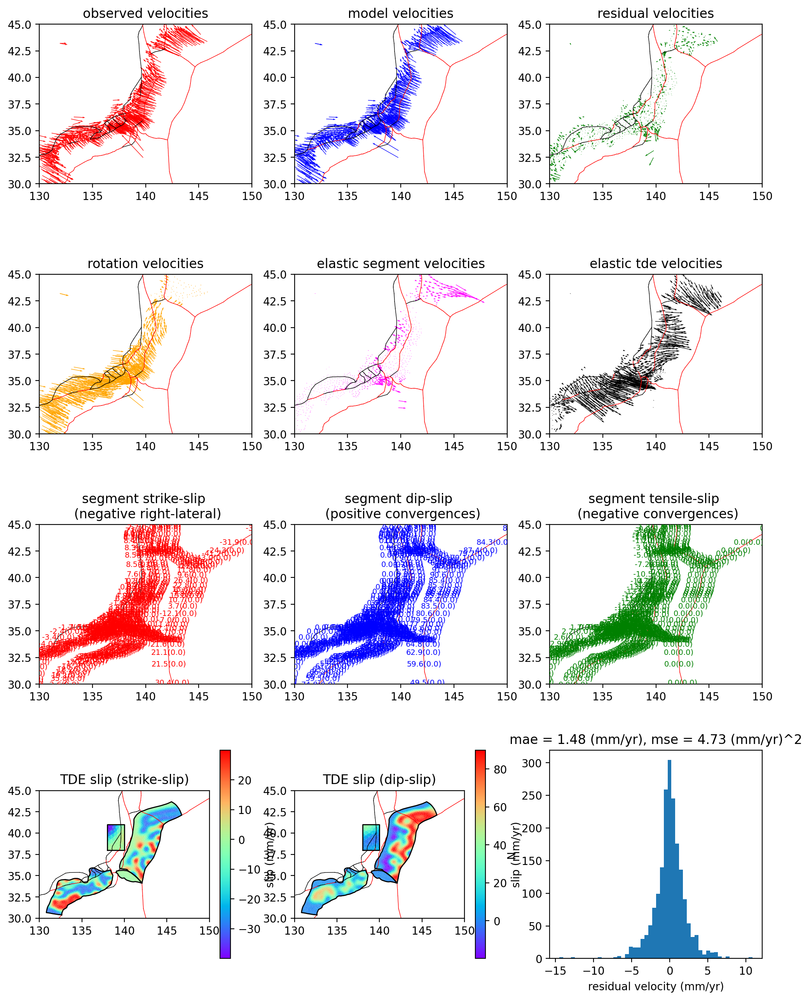

2024-11-11 21:21:19.470 | SUCCESS  | celeri.celeri:plot_estimation_summary:6597 - Wrote figures../runs/0000000442/plot_estimation_summary.(pdf, png)


<Figure size 640x480 with 0 Axes>

In [7]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

In [8]:
# def get_qp_tde_inequality_operator_and_data_vector(index, meshes, operators):
qp_constraint_matrix = np.zeros((4 * index.n_tde_total, index.n_operator_cols_eigen))
qp_constraint_data_vector = np.zeros(4 * index.n_tde_total)

for i in range(index.n_meshes):
    if meshes[i].qp_mesh_tde_bound == 1:
        logger.info(f"USING TDE SLIP RATE BOUNDS FOR MESH {i}")

        # TDE strike- and dip-slip rate lower bounds
        lower_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(index.n_tde[i]),
        )

        # TDE strike- and dip-slip rate upper bounds
        upper_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(index.n_tde[i]),
        )

        # Insert TDE lower bounds into QP constraint data vector (note negative sign)
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i]
        ] = -lower_bound_current_mesh

        # Insert TDE upper bounds into QP constraint data vector
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i]
        ] = upper_bound_current_mesh

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds (note negative sign)
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = -operators.eigenvectors_to_tde_slip[i]

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = operators.eigenvectors_to_tde_slip[i]

    elif meshes[i].qp_mesh_tde_bound_coupling == 1:
        logger.info(f"USING TDE COUPLING BOUNDS FOR MESH {i}")
        # TDE coupling constraints go here
        # TDE strike- and dip-slip coupling lower bounds
        lower_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
            * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
            * np.ones(index.n_tde[i]),
        )

        # TDE strike- and dip-slip coupling upper bounds
        upper_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
            * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
            * np.ones(index.n_tde[i]),
        )

        # Insert TDE lower bounds into QP constraint data vector (note negative sign)
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i]
        ] = -lower_bound_current_mesh

        # Insert TDE upper bounds into QP constraint data vector
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i]
        ] = upper_bound_current_mesh

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds (note negative sign)
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = -operators.eigenvectors_to_tde_slip[i]

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = operators.eigenvectors_to_tde_slip[i]

        # Insert TDE slip rate rotation partials
        # Insert TDE slip rate partials into QP constraint data vector for lower bounds (note negative sign)
        print(f"{operators.eigenvectors_to_tde_slip[i].shape=}")
        print(f"{operators.rotation_to_tri_slip_rate[i].shape=}")

        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i],
            0 : index.start_col_eigen[i],
        ] = -operators.rotation_to_tri_slip_rate[i]

        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i],
            0 : index.start_col_eigen[i],
        ] = operators.rotation_to_tri_slip_rate[i]

        to_plot = qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_end_row_eigen[i],
            :,
        ]
        plt.figure()
        plt.imshow(np.log10(np.abs(to_plot)), aspect="auto")
        plt.title(f"{i=}")
        plt.colorbar()
        plt.show()

    # return qp_constraint_matrix, qp_constraint_data_vector

2024-11-11 21:21:19.501 | INFO     | __main__:<module>:7 - USING TDE SLIP RATE BOUNDS FOR MESH 0
2024-11-11 21:21:19.504 | INFO     | __main__:<module>:7 - USING TDE SLIP RATE BOUNDS FOR MESH 1
2024-11-11 21:21:19.507 | INFO     | __main__:<module>:7 - USING TDE SLIP RATE BOUNDS FOR MESH 2
2024-11-11 21:21:19.508 | INFO     | __main__:<module>:7 - USING TDE SLIP RATE BOUNDS FOR MESH 3


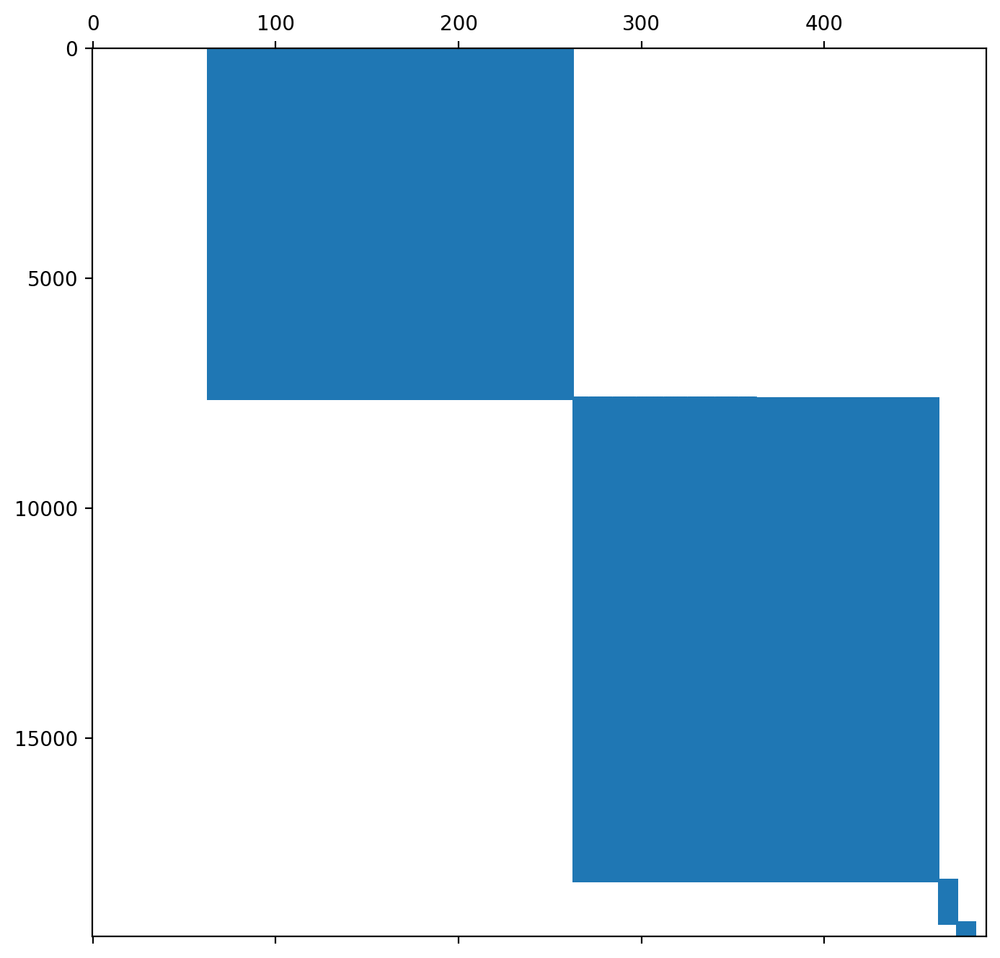

In [9]:
plt.figure(figsize=(8, 8))
plt.spy(qp_constraint_matrix, markersize=1, aspect="auto")
plt.show()

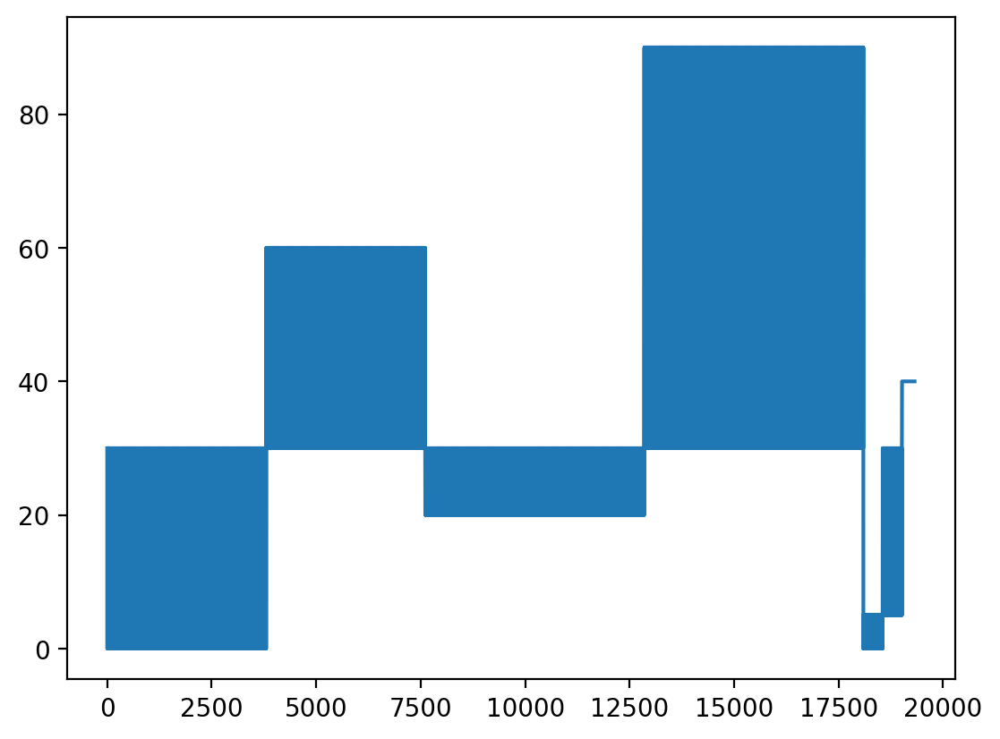

In [10]:
plt.plot(qp_constraint_data_vector)

[]

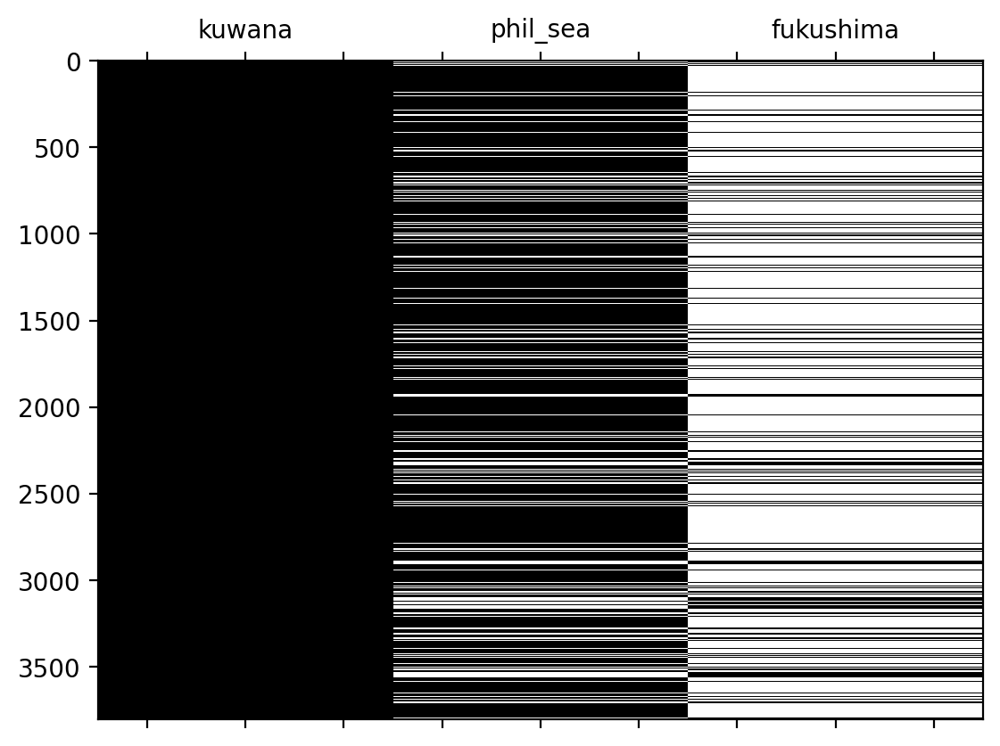

In [11]:
plt.figure()
plt.spy(operators.rotation_to_tri_slip_rate[0][:, 39:48], aspect="auto")
# plt.xticks(range(14))
# plt.xticklabels()

plt.xticks(range(9), ["", "kuwana", "", "", "phil_sea", "", "", "fukushima", ""])
plt.plot()

In [12]:
block

,other1,other2,other3,other4,other5,other6,name,interior_lon,interior_lat,euler_lon,...,rotation_rate,rotation_rate_sig,rotation_flag,apriori_flag,strain_rate,strain_rate_sig,strain_rate_flag,area_steradians,area_plate_carree,block_label
0,0,0,0,0,0,0,kuril-north,141.012,44.169,0,...,0,0,0,0,0,0,0,0.000517,2.153583,0
1,0,0,0,0,0,0,IMP,139.026,36.757,0,...,0,0,0,0,0,0,0,0.001544,7.093937,1
2,0,0,0,0,0,0,name,232.548,74.613,0,...,0,0,0,0,0,0,0,0.000187,0.759888,2
3,0,0,0,0,0,0,pacific,201.774,9.581,0,...,0,0,0,0,0,0,0,0.000259,1.033745,3
4,0,0,0,0,0,0,asia,90.290,57.194,0,...,0,0,0,0,0,0,0,0.618799,5197.088569,4
5,0,0,0,0,0,0,amur,126.871,48.484,0,...,0,0,0,0,0,0,0,0.002323,9.892675,5
6,0,0,0,0,0,0,nw_honshu,17.129,50.806,0,...,0,1,0,0,0,0,0,0.056317,207.861382,6
7,0,0,0,0,0,0,okhotsk,151.258,53.129,0,...,0,0,0,0,0,0,0,0.007581,29.292229,7
8,0,0,0,0,0,0,sanriku,142.136,39.214,0,...,0,0,0,0,0,0,0,0.000105,0.422585,8
9,0,0,0,0,0,0,iida,139.130,38.549,0,...,0,0,0,0,0,0,0,0.006285,26.373494,9


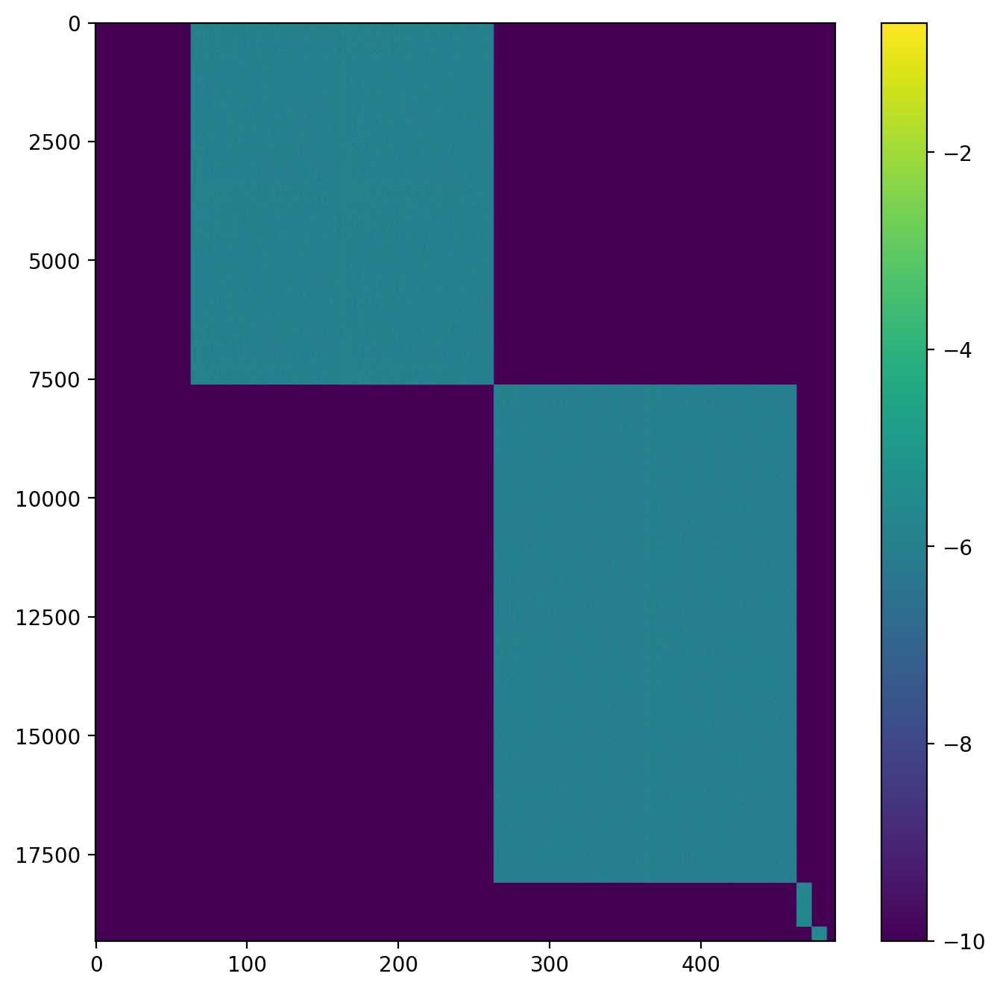

In [13]:
plt.figure(figsize=(8, 8))
plt.imshow(np.log10(np.abs(qp_constraint_matrix + 1e-10)), aspect="auto")
plt.colorbar()
plt.show()

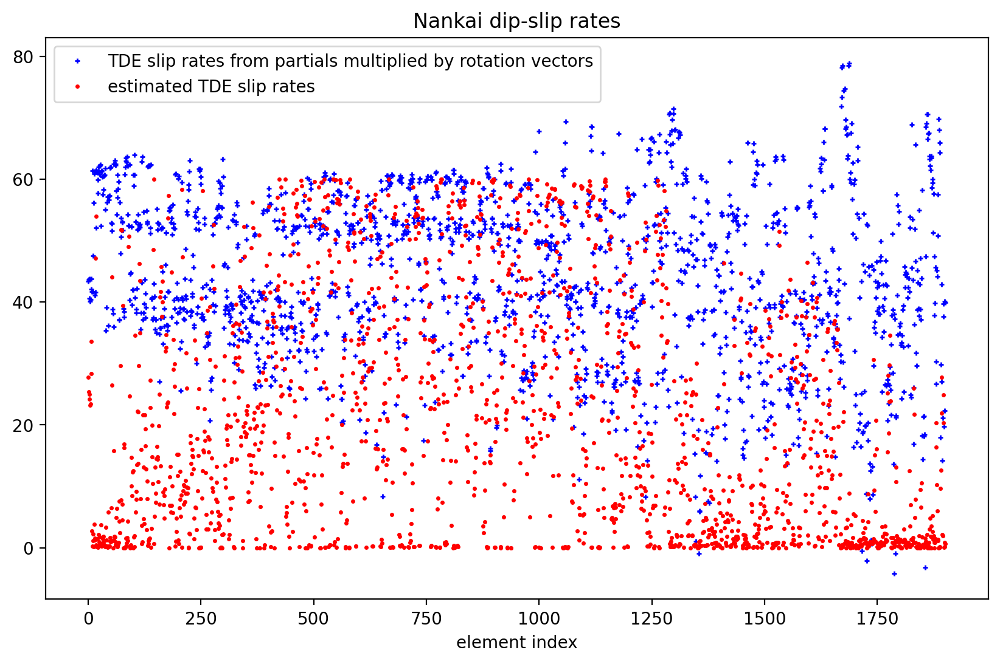

In [14]:
len(estimation_qp.state_vector)

# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix

bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[3 * len(block) : 3 * len(block) + 200]
)


plt.figure(figsize=(10, 6))
plt.plot(
    jpl[1::2],
    "+b",
    markersize=3,
    label="TDE slip rates from partials multiplied by rotation vectors",
)
plt.plot(bjm[1::2], ".r", markersize=3, label="estimated TDE slip rates")
plt.xlabel("element index")
plt.title("Nankai dip-slip rates")
plt.legend()
plt.show()

In [15]:
print(f"{estimation_qp.state_vector.shape=}")
print(f"{operators.eigenvectors_to_tde_slip[0].shape=}")

estimation_qp.state_vector.shape=(489,)
operators.eigenvectors_to_tde_slip[0].shape=(3804, 200)


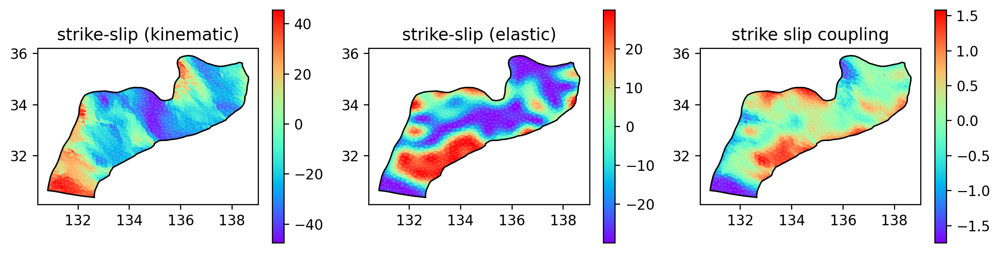

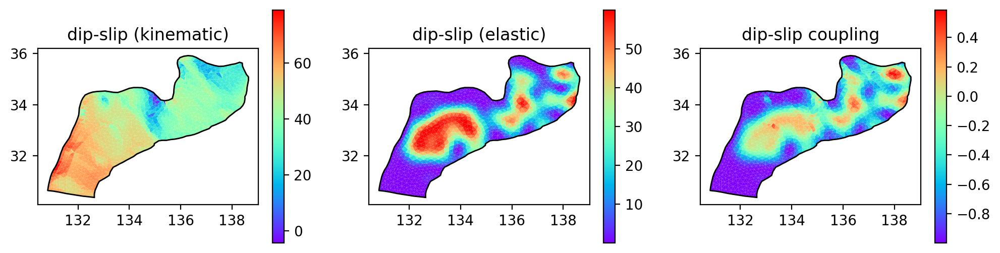

In [16]:
import matplotlib


def plot_mesh(meshes, fill_value, ax):
    x_coords = meshes.points[:, 0]
    y_coords = meshes.points[:, 1]
    vertex_array = np.asarray(meshes.verts)

    if not ax:
        ax = plt.gca()
    xy = np.c_[x_coords, y_coords]
    verts = xy[vertex_array]
    pc = matplotlib.collections.PolyCollection(verts, edgecolor="none", cmap="rainbow")
    pc.set_array(fill_value)
    ax.add_collection(pc)
    ax.autoscale()
    plt.colorbar(pc)

    # Add mesh edge
    x_edge = x_coords[meshes.ordered_edge_nodes[:, 0]]
    y_edge = y_coords[meshes.ordered_edge_nodes[:, 0]]
    x_edge = np.append(x_edge, x_coords[meshes.ordered_edge_nodes[0, 0]])
    y_edge = np.append(y_edge, y_coords[meshes.ordered_edge_nodes[0, 0]])
    plt.plot(x_edge, y_edge, color="black", linewidth=1)
    plt.gca().set_aspect("equal")


plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")


coupling_ss_denominator = np.abs(jpl[0::2])
coupling_ss_denominator_min = 40
coupling_ss_denominator[coupling_ss_denominator < coupling_ss_denominator_min] = (
    coupling_ss_denominator_min
)
coupling_ss = (bjm[0::2] - jpl[0::2]) / coupling_ss_denominator

coupling_ds_denominator = np.abs(jpl[1::2])
coupling_ds_denominator_min = 40
coupling_ds_denominator[coupling_ds_denominator < coupling_ds_denominator_min] = (
    coupling_ds_denominator_min
)
coupling_ds = (bjm[1::2] - jpl[1::2]) / coupling_ds_denominator


plt.subplot(1, 3, 3)
plot_mesh(meshes[0], coupling_ss, plt.gca())
# plot_mesh(meshes[0], np.log10(np.abs((bjm[0::2] - jpl[0::2]) / np.abs(jpl[0::2]))), plt.gca())
plt.title("strike slip coupling")
plt.show()

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[1::2], plt.gca())
plt.title("dip-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[1::2], plt.gca())
plt.title("dip-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], coupling_ds, plt.gca())
# plot_mesh(meshes[0], np.log10(np.abs((bjm[1::2] - jpl[1::2]) / np.abs(jpl[1::2]))), plt.gca())

plt.title("dip-slip coupling")
plt.show()

# Correct coupling calculation

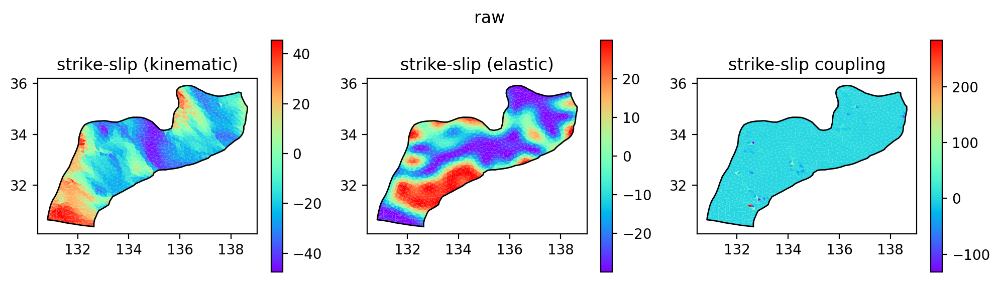

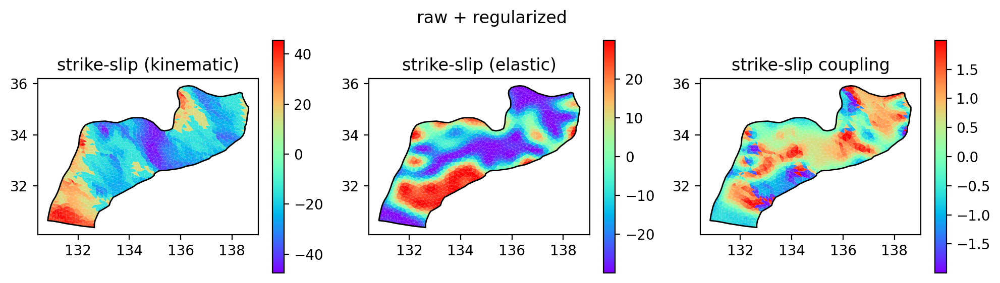

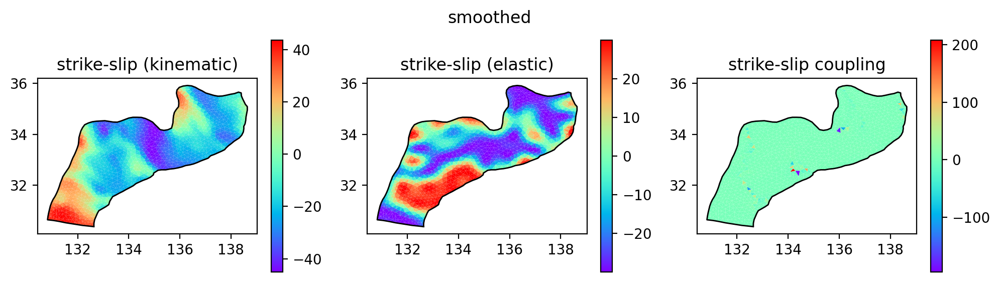

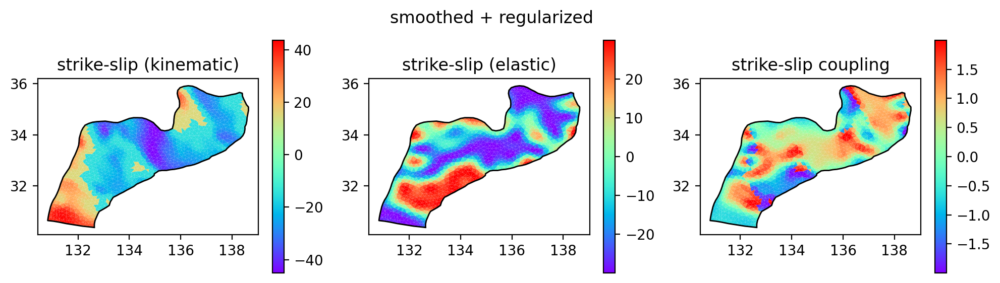

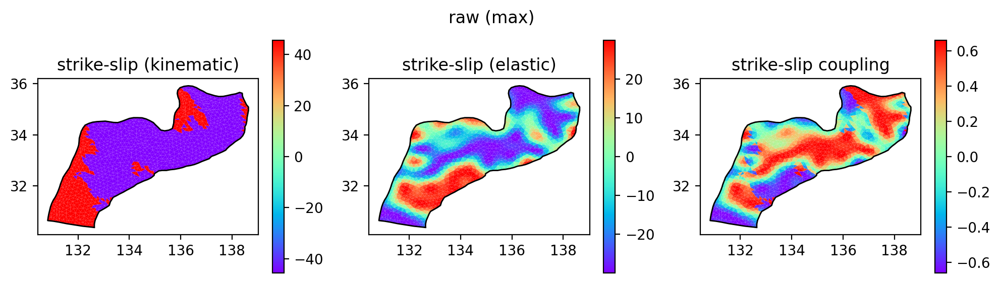

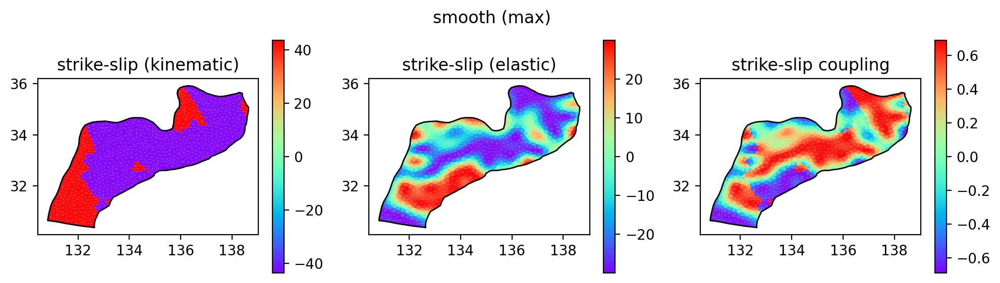

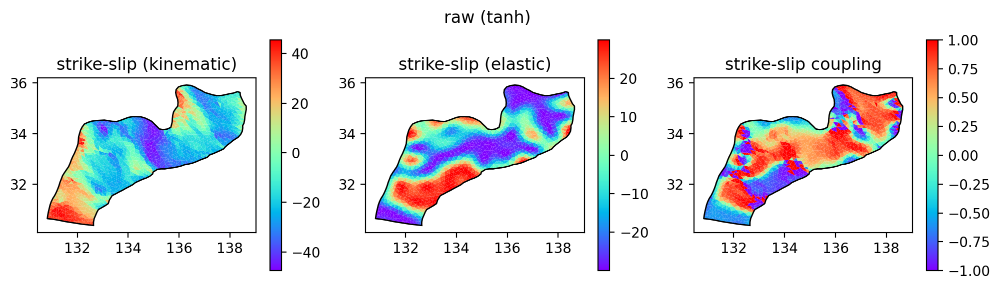

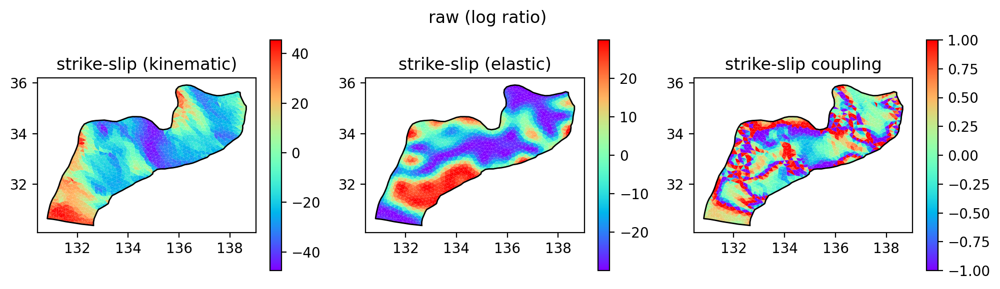

In [17]:
def smooth_irregular_data(x_coords, y_coords, values, length_scale):
    # Build a KDTree for efficient neighbor searching
    points = np.vstack((x_coords, y_coords)).T
    tree = cKDTree(points)

    # Prepare an array to store the smoothed values
    smoothed_values = np.zeros_like(values)

    # Smoothing calculation
    for i, point in enumerate(points):
        # Find neighbors within 3 * length_scale for efficiency
        indices = tree.query_ball_point(point, 3 * length_scale)

        # Calculate distances and apply Gaussian weights
        distances = np.linalg.norm(points[indices] - point, axis=1)
        weights = np.exp(-(distances**2) / (2 * length_scale**2))

        # Weighted sum for smoothing
        smoothed_values[i] = np.sum(weights * values[indices]) / np.sum(weights)

    return smoothed_values


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.1
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.1
)

coupling_ss = bjm[0::2] / jpl_ss_smooth

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / jpl[0::2], plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw")
plt.show()


plt.figure(figsize=(12, 3))
a = np.abs(jpl[0::2])
a[a < 15.0] = 15.0
a = a * np.sign(jpl[0::2])

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw + regularized")
plt.show()


plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl_ss_smooth, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
a = np.abs(jpl_ss_smooth)
a = a * np.sign(jpl_ss_smooth)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("smoothed")
plt.show()


plt.figure(figsize=(12, 3))
a = np.abs(jpl_ss_smooth)
a[a < 15.0] = 15.0
a = a * np.sign(jpl_ss_smooth)

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("smoothed + regularized")
plt.show()


plt.figure(figsize=(12, 3))
a = np.max(jpl[0::2])
a = a * np.sign(jpl[0::2])

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw (max)")
plt.show()


plt.figure(figsize=(12, 3))
a = np.max(jpl_ss_smooth)
a = a * np.sign(jpl_ss_smooth)

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("smooth (max)")
plt.show()


plt.figure(figsize=(12, 3))
a = jpl[0::2]

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], np.tanh(1e0 * bjm[0::2] / a), plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw (tanh)")
plt.show()


def bounded_log_ratio(a, b, epsilon=1e-10, scaling_factor=10):
    # Add epsilon to avoid division by zero and log of zero
    safe_b = np.where(np.abs(b) < epsilon, epsilon, b)

    # Compute the log-ratio and scale it
    log_ratio = np.log(np.abs(a / safe_b) + epsilon)
    scaled_log_ratio = log_ratio / scaling_factor

    # Bound the result and reapply the sign
    bounded_ratio = np.clip(scaled_log_ratio, -1, 1) * np.sign(a / safe_b)

    return bounded_ratio


plt.figure(figsize=(12, 3))
a = jpl[0::2]

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
ratio = bounded_log_ratio(bjm[0::2], a, epsilon=1e-10, scaling_factor=1)
plot_mesh(meshes[0], ratio, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw (log ratio)")
plt.show()


# plt.figure(figsize=(15, 5))
# plt.plot(jpl[0::2], ".", label="kinematic (raw)")
# plt.plot(jpl_ss_smooth, ".", label="kinematic (smoothed)")
# plt.plot(bjm[0::2], ".", label="elastic")
# plt.legend()
# plt.show()

Text(0.5, 1.0, 'dip-slip (kinematic) - smoothed')

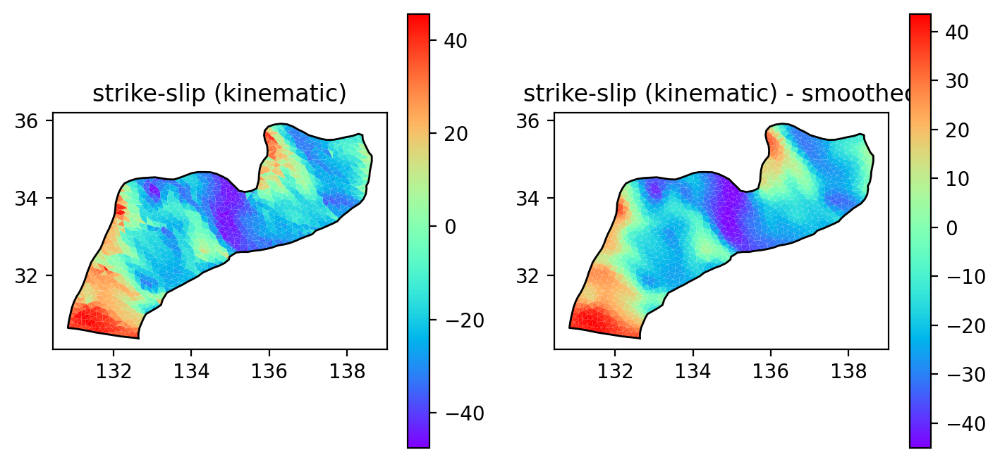

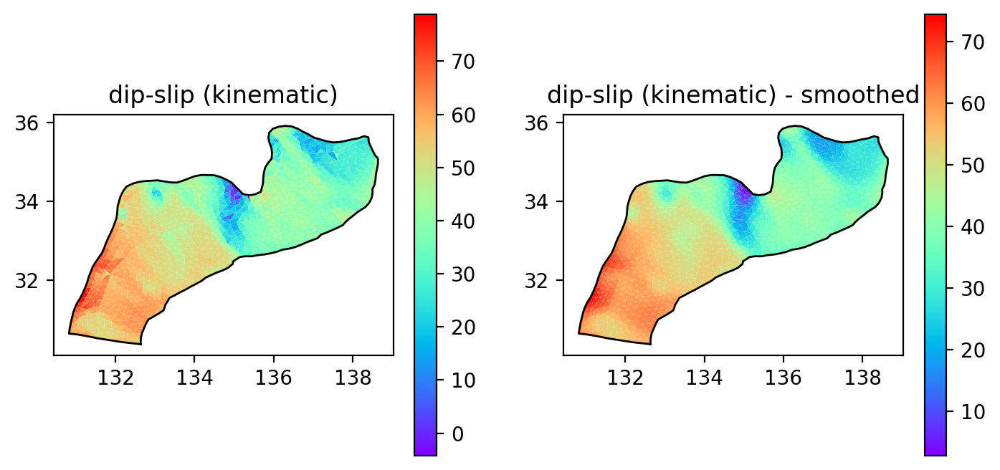

In [18]:
import numpy as np
from scipy.spatial import cKDTree


def smooth_irregular_data(x_coords, y_coords, values, length_scale):
    # Build a KDTree for efficient neighbor searching
    points = np.vstack((x_coords, y_coords)).T
    tree = cKDTree(points)

    # Prepare an array to store the smoothed values
    smoothed_values = np.zeros_like(values)

    # Smoothing calculation
    for i, point in enumerate(points):
        # Find neighbors within 3 * length_scale for efficiency
        indices = tree.query_ball_point(point, 3 * length_scale)

        # Calculate distances and apply Gaussian weights
        distances = np.linalg.norm(points[indices] - point, axis=1)
        weights = np.exp(-(distances**2) / (2 * length_scale**2))

        # Weighted sum for smoothing
        smoothed_values[i] = np.sum(weights * values[indices]) / np.sum(weights)

    return smoothed_values


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.1
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.1
)


plt.figure(figsize=(13, 4))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")
plt.subplot(1, 3, 2)
plot_mesh(meshes[0], jpl_ss_smooth, plt.gca())
plt.title("strike-slip (kinematic) - smoothed")

plt.figure(figsize=(13, 4))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[1::2], plt.gca())
plt.title("dip-slip (kinematic)")
plt.subplot(1, 3, 2)
plot_mesh(meshes[0], jpl_ds_smooth, plt.gca())
plt.title("dip-slip (kinematic) - smoothed")

# Attempt iterative bounded coupling solve

2024-11-11 21:21:24.595 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:24.596 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:24.596 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 522 TDEs
2024-11-11 21:21:24.597 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 235 TDEs
2024-11-11 21:21:24.597 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:24.598 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:24.598 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 757 TDEs
2024-11-11 21:21:24.599 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=0, n_oob=757


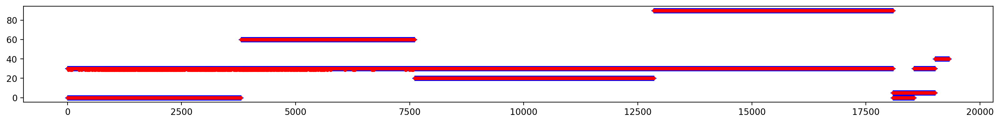

2024-11-11 21:21:25.715 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:25.716 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:25.716 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 502 TDEs
2024-11-11 21:21:25.717 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 176 TDEs
2024-11-11 21:21:25.717 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:25.717 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:25.717 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 678 TDEs
2024-11-11 21:21:25.718 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=1, n_oob=678


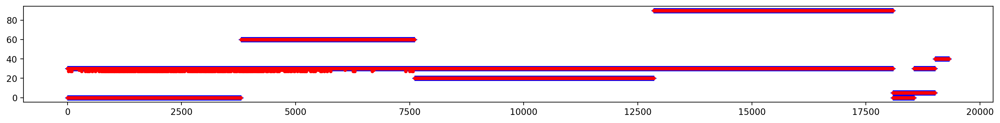

2024-11-11 21:21:26.859 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:26.860 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:26.860 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 460 TDEs
2024-11-11 21:21:26.861 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 116 TDEs
2024-11-11 21:21:26.861 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:26.862 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:26.863 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 576 TDEs
2024-11-11 21:21:26.863 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=2, n_oob=576


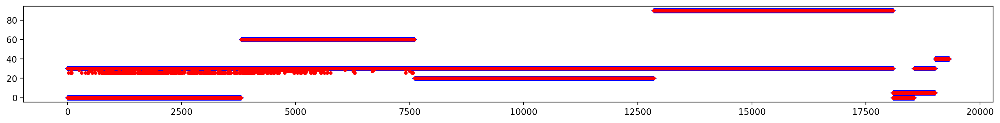

2024-11-11 21:21:27.912 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:27.913 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:27.913 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 391 TDEs
2024-11-11 21:21:27.914 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 71 TDEs
2024-11-11 21:21:27.914 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:27.915 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:27.915 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 462 TDEs
2024-11-11 21:21:27.915 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=3, n_oob=462


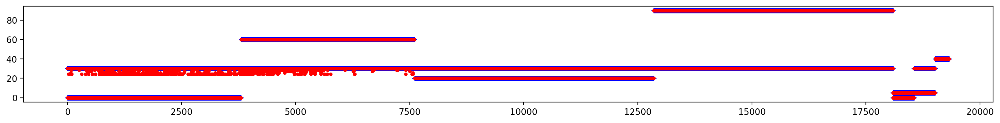

2024-11-11 21:21:28.978 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:28.979 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:28.980 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 246 TDEs
2024-11-11 21:21:28.980 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 44 TDEs
2024-11-11 21:21:28.981 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:28.981 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:28.982 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 290 TDEs
2024-11-11 21:21:28.982 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=4, n_oob=290


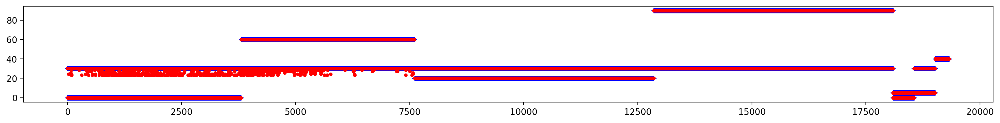

2024-11-11 21:21:30.059 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:30.060 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:30.061 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 4 TDEs
2024-11-11 21:21:30.061 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs
2024-11-11 21:21:30.062 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:30.062 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:30.063 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 5 TDEs
2024-11-11 21:21:30.063 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=5, n_oob=5


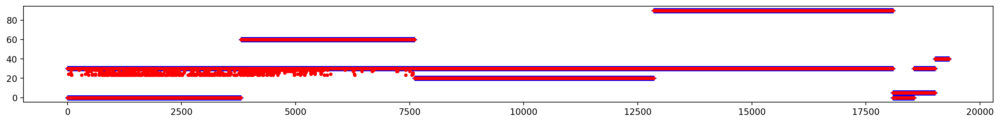

2024-11-11 21:21:31.198 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:31.199 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:31.199 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 4 TDEs
2024-11-11 21:21:31.199 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs
2024-11-11 21:21:31.200 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:31.200 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:31.201 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 5 TDEs
2024-11-11 21:21:31.201 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=6, n_oob=5


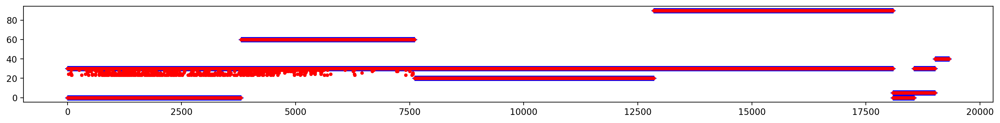

2024-11-11 21:21:32.346 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:32.346 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:32.347 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 4 TDEs
2024-11-11 21:21:32.347 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs
2024-11-11 21:21:32.348 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:32.348 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:32.349 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 5 TDEs
2024-11-11 21:21:32.349 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=7, n_oob=5


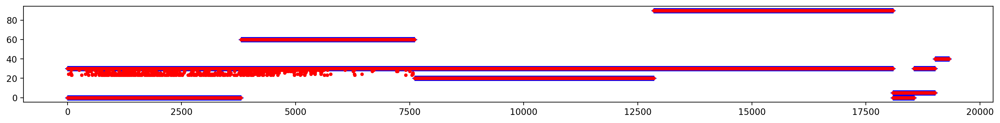

2024-11-11 21:21:33.474 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:33.474 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:33.475 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:33.475 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs
2024-11-11 21:21:33.476 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:33.476 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:33.476 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 1 TDEs
2024-11-11 21:21:33.476 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: True
i=8, n_oob=1


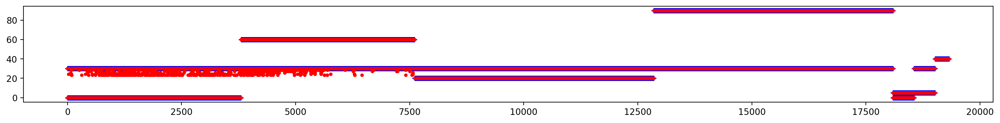

2024-11-11 21:21:34.646 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:34.647 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:34.647 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:34.648 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:34.648 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:34.648 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:34.649 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:34.649 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=9, n_oob=0


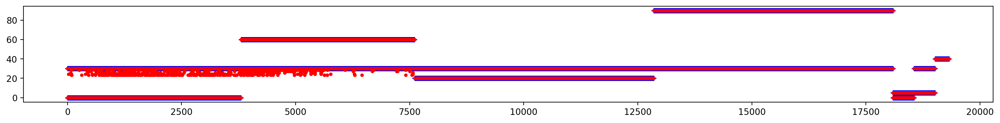

2024-11-11 21:21:35.754 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:35.755 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:35.755 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:35.756 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:35.756 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:35.756 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:35.757 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:35.758 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=10, n_oob=0


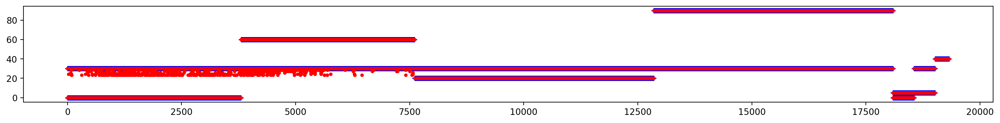

2024-11-11 21:21:36.823 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:36.823 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:36.824 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:36.824 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:36.825 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:36.825 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:36.826 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:36.826 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=11, n_oob=0


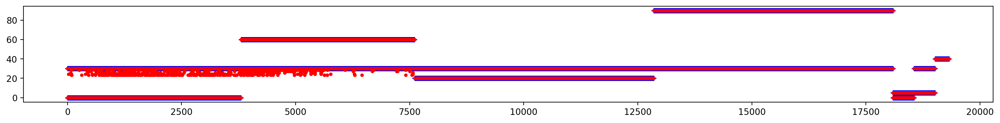

2024-11-11 21:21:37.914 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:37.915 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:37.915 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:37.915 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:37.916 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:37.916 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:37.917 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:37.917 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=12, n_oob=0


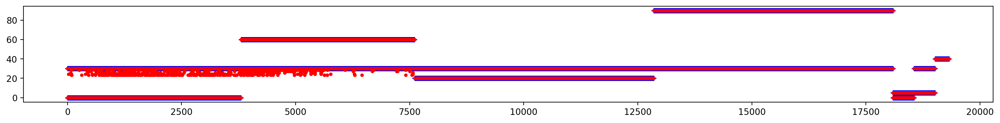

2024-11-11 21:21:38.982 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:38.983 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:38.983 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:38.983 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:38.983 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:38.984 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:38.984 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:38.985 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=13, n_oob=0


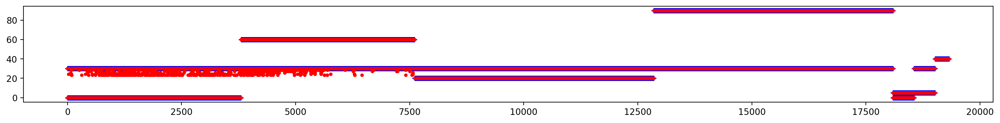

2024-11-11 21:21:40.117 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:40.117 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:40.118 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:40.118 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:40.119 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:40.119 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:40.119 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:40.119 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=14, n_oob=0


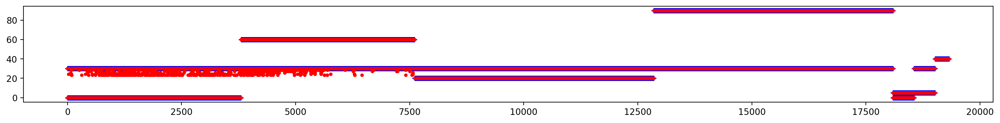

2024-11-11 21:21:41.201 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:41.201 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:41.202 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:41.202 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:41.202 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:41.203 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:41.203 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:41.204 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=15, n_oob=0


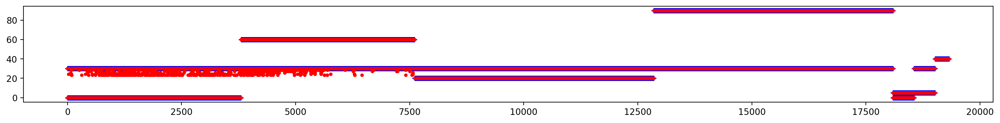

2024-11-11 21:21:42.261 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:42.261 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:42.262 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:42.262 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:42.263 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:42.263 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:42.264 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:42.265 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=16, n_oob=0


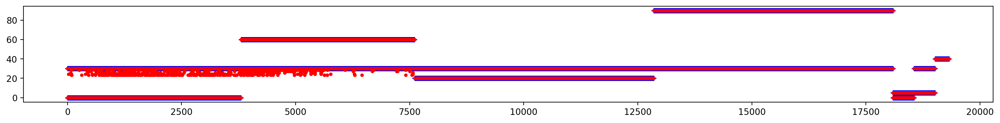

2024-11-11 21:21:43.350 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:43.350 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:43.351 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:43.351 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:43.352 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:43.352 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:43.352 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:43.353 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=17, n_oob=0


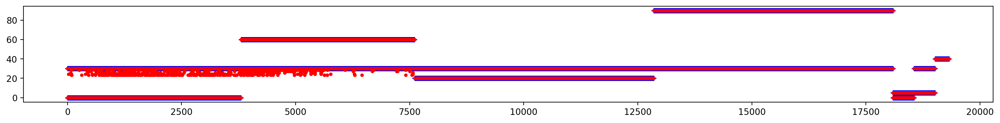

2024-11-11 21:21:44.463 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:44.464 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:44.464 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:44.464 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:44.465 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:44.465 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:44.465 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:44.466 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=18, n_oob=0


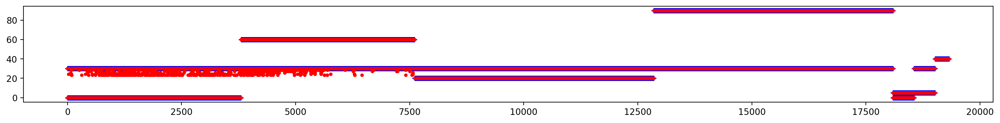

2024-11-11 21:21:45.572 | INFO     | __main__:check_coupling_bounds:59 - SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5
2024-11-11 21:21:45.572 | INFO     | __main__:check_coupling_bounds:62 - DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1
2024-11-11 21:21:45.573 | INFO     | __main__:check_coupling_bounds:90 - MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:45.573 | INFO     | __main__:check_coupling_bounds:93 - MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:45.574 | INFO     | __main__:check_coupling_bounds:96 - MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:45.574 | INFO     | __main__:check_coupling_bounds:99 - MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs
2024-11-11 21:21:45.575 | INFO     | __main__:check_coupling_bounds:102 - TOTAL TDES OOB 0 TDEs
2024-11-11 21:21:45.575 | INFO     | __main__:check_coupling_bounds:109 - CONTINUE COUPLING RELAXATION ITERATION: False
i=19, n_oob=0


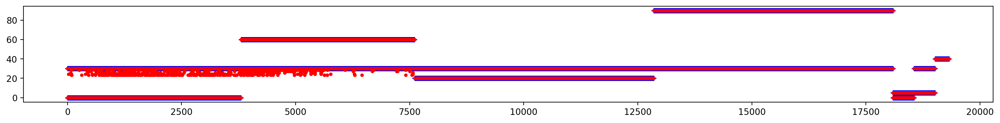

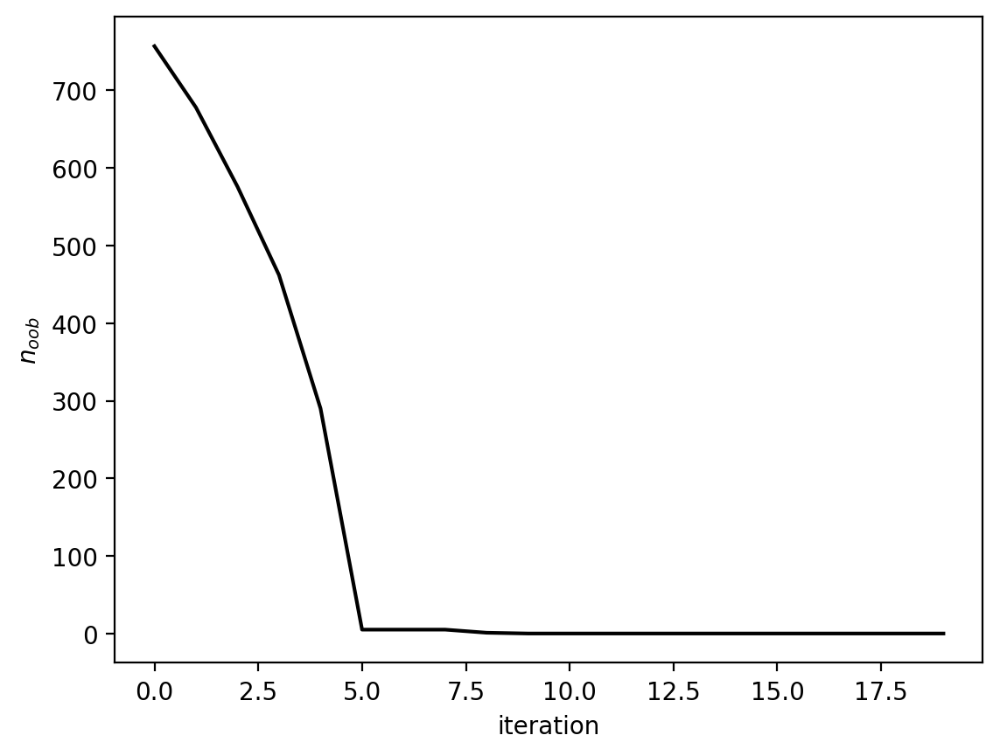

In [ ]:
# Determine if coupling constraints are violated on any non-CMI mesh


def check_coupling_bounds(
    meshes,
    estimation_qp,
    current_ss_bounds_lower,
    current_ss_bounds_upper,
    current_ds_bounds_lower,
    current_ds_bounds_upper,
    debug_plot=False,
):
    """
    *mesh_parameter.json variable names for reference:

    TDE rate bounds:
    "qp_mesh_tde_bound": 1,
    "qp_mesh_tde_slip_rate_lower_bound_ss": -30,
    "qp_mesh_tde_slip_rate_upper_bound_ss": 30,
    "qp_mesh_tde_slip_rate_lower_bound_ds": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds": 60,

    TDE coupling bounds:
    "qp_mesh_tde_bound_coupling": 0,
    "qp_mesh_tde_slip_rate_lower_bound_ss_coupling": -0.5,
    "qp_mesh_tde_slip_rate_upper_bound_ss_coupling": 0.5,
    "qp_mesh_tde_slip_rate_lower_bound_ds_coupling": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds_coupling": 1,

    """

    # for i in range(np.max(segment.patch_file_name) + 1):
    for i in range(1):
        # Calculate coupling for each non-CMI mesh

        # Multiply rotation vector components by TDE slip rate partials
        kinematic_tde_rates = (
            operators.rotation_to_tri_slip_rate[i]
            @ estimation_qp.state_vector[0 : 3 * len(block)]
        )

        # Multiply eigen modes by eigen to TDE matrix
        estimated_tde_rates = (
            operators.eigenvectors_to_tde_slip[i]
            @ estimation_qp.state_vector[
                3 * len(block) : 3 * len(block) + 200
            ]  # TODO: Fix column indexing
        )

        # Calculate coupling (max slip rate version)
        tde_coupling_ss = estimated_tde_rates[0::2] / np.max(
            np.abs(kinematic_tde_rates[0::2])
        )
        tde_coupling_ds = estimated_tde_rates[1::2] / np.max(
            np.abs(kinematic_tde_rates[1::2])
        )

        # Report on OOB cases
        logger.info(
            f"SS TDE COUPLING BOUNDS FOR MESH {i}, min={meshes[i].qp_mesh_tde_slip_rate_lower_bound_ss_coupling}, max={ meshes[i].qp_mesh_tde_slip_rate_upper_bound_ss_coupling}"
        )
        logger.info(
            f"DS TDE COUPLING BOUNDS FOR MESH {i}, min={meshes[i].qp_mesh_tde_slip_rate_lower_bound_ds_coupling}, max={ meshes[i].qp_mesh_tde_slip_rate_upper_bound_ds_coupling}"
        )

        # Find indices of TDEs with out of bound coupling values
        tde_coupling_ss_lower_oob_idx = np.where(
            tde_coupling_ss < meshes[i].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
        )[0]
        tde_coupling_ss_upper_oob_idx = np.where(
            tde_coupling_ss > meshes[i].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
        )[0]

        tde_coupling_ds_lower_oob_idx = np.where(
            tde_coupling_ds < meshes[i].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
        )[0]
        tde_coupling_ds_upper_oob_idx = np.where(
            tde_coupling_ss > meshes[i].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
        )[0]

        # Total number of OOB coupling constraints
        n_oob = (
            len(tde_coupling_ss_lower_oob_idx)
            + len(tde_coupling_ss_upper_oob_idx)
            + len(tde_coupling_ds_lower_oob_idx)
            + len(tde_coupling_ds_upper_oob_idx)
        )

        # Report the number and type of coupling OOB
        logger.info(
            f"MIN SS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ss_lower_oob_idx)} TDEs"
        )
        logger.info(
            f"MAX SS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ss_upper_oob_idx)} TDEs"
        )
        logger.info(
            f"MIN DS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ds_lower_oob_idx)} TDEs"
        )
        logger.info(
            f"MAX DS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ds_upper_oob_idx)} TDEs"
        )
        logger.info(f"TOTAL TDES OOB {n_oob} TDEs")

        # Determine whether or not updating is required
        if n_oob > 0:
            continue_iterate_for_coupling_bounds = True
        else:
            continue_iterate_for_coupling_bounds = False
        logger.info(
            f"CONTINUE COUPLING RELAXATION ITERATION: {continue_iterate_for_coupling_bounds}"
        )

        # Make vectors for update slip rates (not neccesary but useful for debugging)
        updated_ss_bounds_lower = np.copy(current_ss_bounds_lower)
        updated_ss_bounds_upper = np.copy(current_ss_bounds_upper)
        updated_ds_bounds_lower = np.copy(current_ds_bounds_lower)
        updated_ds_bounds_upper = np.copy(current_ds_bounds_upper)

        # Update slip rate bounds
        slip_rate_reduction_rate = 0.95
        updated_ss_bounds_lower[
            tde_coupling_ss_lower_oob_idx
        ] *= slip_rate_reduction_rate

        updated_ss_bounds_upper[
            tde_coupling_ss_upper_oob_idx
        ] *= slip_rate_reduction_rate

        updated_ds_bounds_lower[
            tde_coupling_ds_lower_oob_idx
        ] *= slip_rate_reduction_rate

        updated_ds_bounds_upper[
            tde_coupling_ds_upper_oob_idx
        ] *= slip_rate_reduction_rate

        if debug_plot == True:
            # Plot locations of TDEs with out of bound coupling values
            plt.figure(figsize=(11, 5))
            plt.subplot(1, 2, 1)
            plot_mesh(meshes[0], tde_coupling_ss, plt.gca())
            plt.plot(
                meshes[0].lon_centroid[tde_coupling_ss_lower_oob_idx],
                meshes[0].lat_centroid[tde_coupling_ss_lower_oob_idx],
                "k+",
                label="below min",
            )
            plt.plot(
                meshes[0].lon_centroid[tde_coupling_ss_upper_oob_idx],
                meshes[0].lat_centroid[tde_coupling_ss_upper_oob_idx],
                "g+",
                label="above max",
            )
            plt.legend()
            plt.title("strike-slip coupling oob")

            plt.subplot(1, 2, 2)
            plot_mesh(meshes[0], tde_coupling_ds, plt.gca())
            plt.plot(
                meshes[0].lon_centroid[tde_coupling_ds_lower_oob_idx],
                meshes[0].lat_centroid[tde_coupling_ds_lower_oob_idx],
                "bx",
                label="below min",
            )
            plt.plot(
                meshes[0].lon_centroid[tde_coupling_ds_upper_oob_idx],
                meshes[0].lat_centroid[tde_coupling_ds_upper_oob_idx],
                "g+",
                label="above max",
            )
            plt.legend()
            plt.title("dip-slip coupling oob")
            plt.show()

            # Plot adjusted bounds on mesh
            plt.figure(figsize=(20, 5))
            plt.subplot(1, 4, 1)
            plot_mesh(meshes[0], updated_ss_bounds_lower, plt.gca())
            plt.title("ss adjusted lower bounds")
            plt.subplot(1, 4, 2)
            plot_mesh(meshes[0], updated_ss_bounds_upper, plt.gca())
            plt.title("ss adjusted upper bounds")
            plt.subplot(1, 4, 3)
            plot_mesh(meshes[0], updated_ds_bounds_lower, plt.gca())
            plt.title("ds adjusted lower bounds")
            plt.subplot(1, 4, 4)
            plot_mesh(meshes[0], updated_ds_bounds_upper, plt.gca())
            plt.title("ds adjusted upper bounds")
            plt.show()

    return (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        n_oob,
    )


# Current TDE slip rates
current_ss_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(
    meshes[0].n_tde
)
current_ss_bounds_upper = meshes[0].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(
    meshes[0].n_tde
)
current_ds_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(
    meshes[0].n_tde
)
current_ds_bounds_upper = meshes[0].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(
    meshes[0].n_tde
)

# # Check to see if iterating is neccesary to match coupling bounds
# (
#     continue_iterate_for_coupling_bounds,
#     updated_ss_bounds_lower,
#     updated_ss_bounds_upper,
#     updated_ds_bounds_lower,
#     updated_ds_bounds_upper,
#     n_oob,
# ) = check_coupling_bounds(
#     meshes,
#     estimation_qp,
#     current_ss_bounds_lower,
#     current_ss_bounds_upper,
#     current_ds_bounds_lower,
#     current_ds_bounds_upper,
# )


# print(f"{continue_iterate_for_coupling_bounds=}")

n_iter = 10
n_oob_vec = np.zeros(n_iter)
for i in range(n_iter):
    # Check bounds
    (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        n_oob,
    ) = check_coupling_bounds(
        meshes,
        estimation_qp,
        current_ss_bounds_lower,
        current_ss_bounds_upper,
        current_ds_bounds_lower,
        current_ds_bounds_upper,
    )
    print(f"{i=}, {n_oob=}")
    n_oob_vec[i] = n_oob

    # Build and insert update slip rate bounds into QP inequality vector
    updated_lower_bounds = -1.0 * celeri.interleave2(
        updated_ss_bounds_lower, updated_ds_bounds_lower
    )
    updated_upper_bounds = celeri.interleave2(
        updated_ss_bounds_upper, updated_ds_bounds_upper
    )
    updated_bounds = np.hstack((updated_lower_bounds, updated_upper_bounds))

    updated_qp_inequality_constraints_data_vector = np.copy(
        qp_inequality_constraints_data_vector
    )

    updated_qp_inequality_constraints_data_vector[0 : len(updated_bounds)] = (
        updated_bounds
    )

    plt.figure(figsize=(20, 2))
    # plt.plot(qp_inequality_constraints_data_vector[0 : len(updated_bounds)], "+b")
    # plt.plot(
    #     updated_qp_inequality_constraints_data_vector[0 : len(updated_bounds)], "r."
    # )

    # plt.plot(qp_inequality_constraints_data_vector[0:500], "+b")
    # plt.plot(updated_qp_inequality_constraints_data_vector[0:500], "r.")

    plt.plot(qp_inequality_constraints_data_vector, "+b")
    plt.plot(updated_qp_inequality_constraints_data_vector, "r.")

    plt.show()

    # print(f"{len(updated_bounds)=}")
    # print(f"{len(updated_qp_inequality_constraints_data_vector)=}")

    # QP solve with updated TDE slip rate constraints
    opts = {"show_progress": False}
    solution_qp = celeri.lsqlin_qp(
        operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
        data_vector_eigen * np.sqrt(weighting_vector_eigen),
        0,
        qp_inequality_constraints_matrix,  # Inequality matrix
        updated_qp_inequality_constraints_data_vector,  # Inequality data vector
        None,
        None,
        None,
        None,
        None,
        opts,
    )

    # Create estimation data structure and calculate derived quantities
    # estimation_qp = addict.Dict()
    # estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
    estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
    estimation_qp.operator = operators.eigen
    celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)

    # Set updated* to current* for next iteration
    current_ss_bounds_lower = np.copy(updated_ss_bounds_lower)
    current_ss_bounds_upper = np.copy(updated_ss_bounds_upper)
    current_ds_bounds_lower = np.copy(updated_ds_bounds_lower)
    current_ds_bounds_upper = np.copy(updated_ds_bounds_upper)


plt.figure()
plt.plot(n_oob_vec, "-k")
plt.xlabel("iteration")
plt.ylabel("$n_{oob}$")
plt.show()
# "qp_mesh_tde_slip_rate_lower_bound_ss": -30,
# "qp_mesh_tde_slip_rate_upper_bound_ss": 30,
# "qp_mesh_tde_slip_rate_lower_bound_ds": 0,
# "qp_mesh_tde_slip_rate_upper_bound_ds": 60,

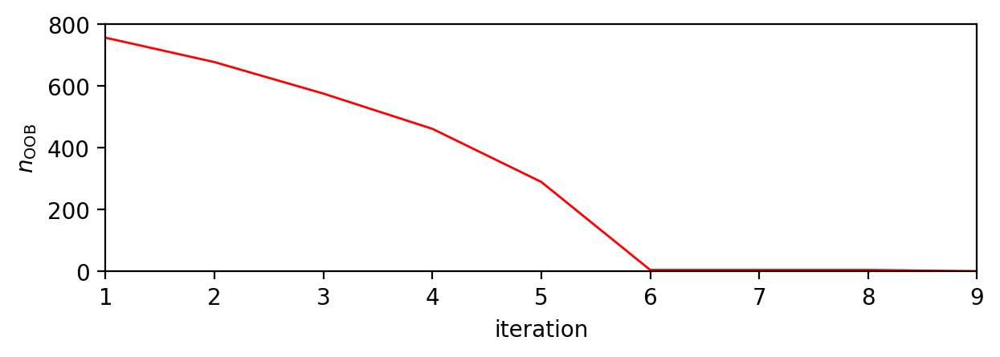

In [41]:
first_zero_index = np.where(n_oob_vec == 0)[0][0]
plt.figure(figsize=(7, 2))
xx = np.arange(1, first_zero_index + 1)
plt.plot(xx, n_oob_vec[0:first_zero_index], "-r", linewidth=1.0)
plt.xlabel("iteration")
plt.ylabel("$n_\mathrm{OOB}$")
plt.xticks(xx)
plt.xlim([np.min(xx), np.max(xx)])
plt.ylim([0, 800])
# plt.yscale("log")
plt.show()

In [39]:
xx

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

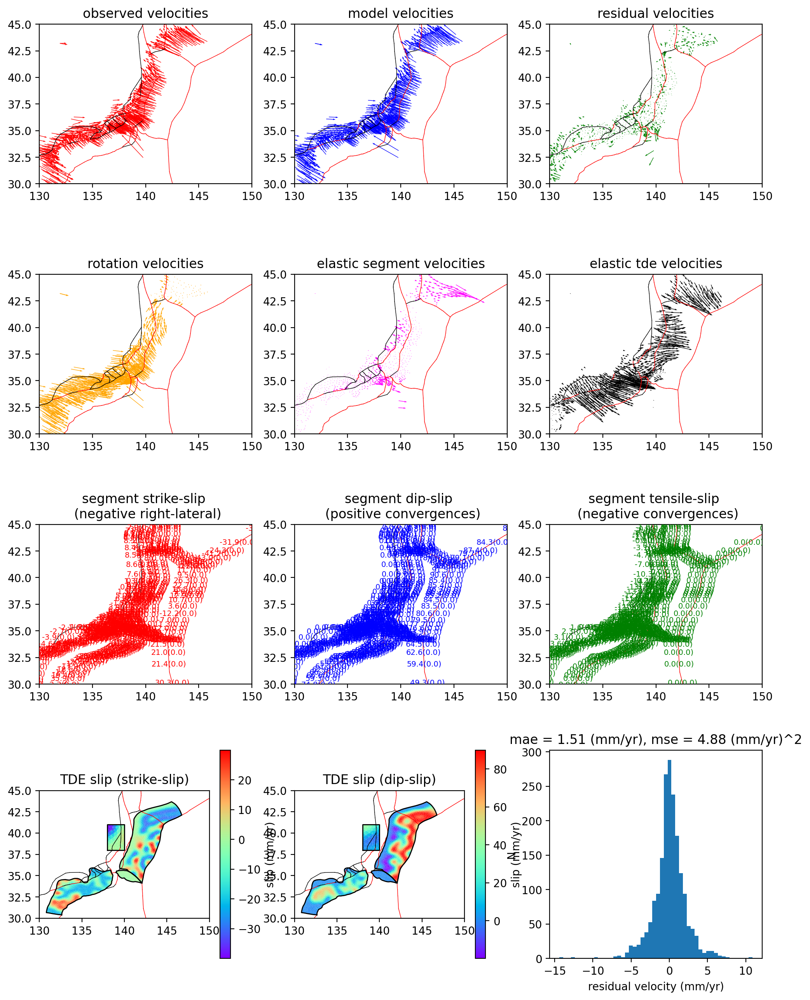

2024-11-11 21:21:51.274 | SUCCESS  | celeri.celeri:plot_estimation_summary:6597 - Wrote figures../runs/0000000442/plot_estimation_summary.(pdf, png)


<Figure size 640x480 with 0 Axes>

In [20]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

### Coupling intuition check

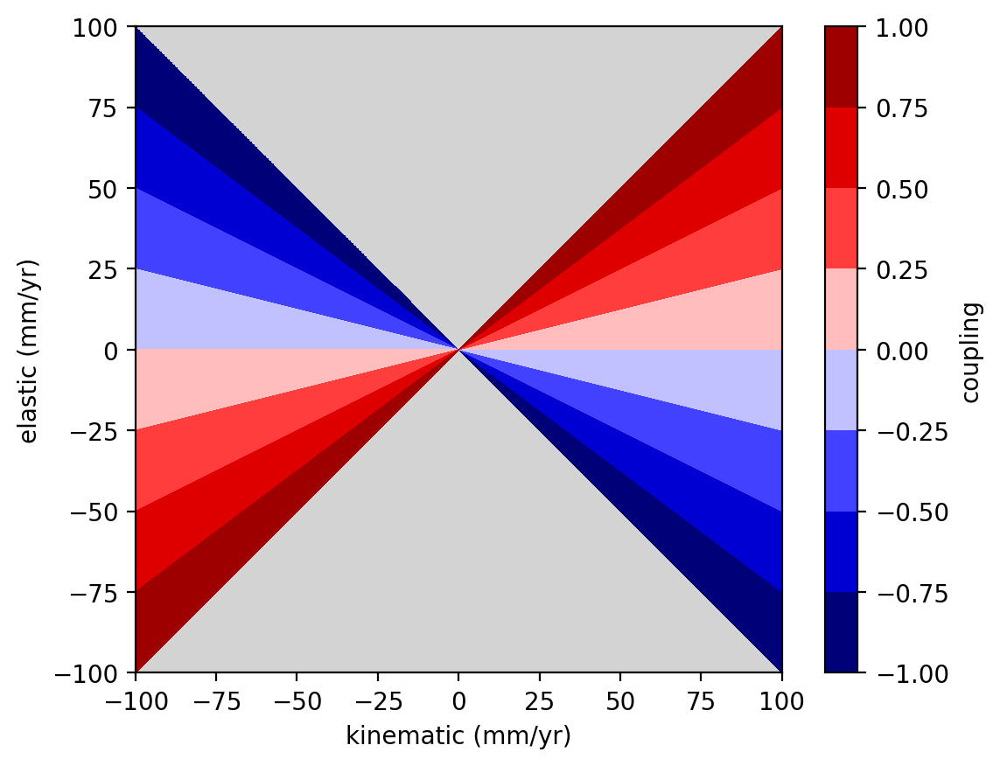

In [21]:
j = np.linspace(-100, 100, 1000)
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
coupling_grid = b_grid / j_grid
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan

plt.figure()
plt.contourf(j, b, coupling_grid, cmap="seismic")
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()

# Calculate length scales of KL modes

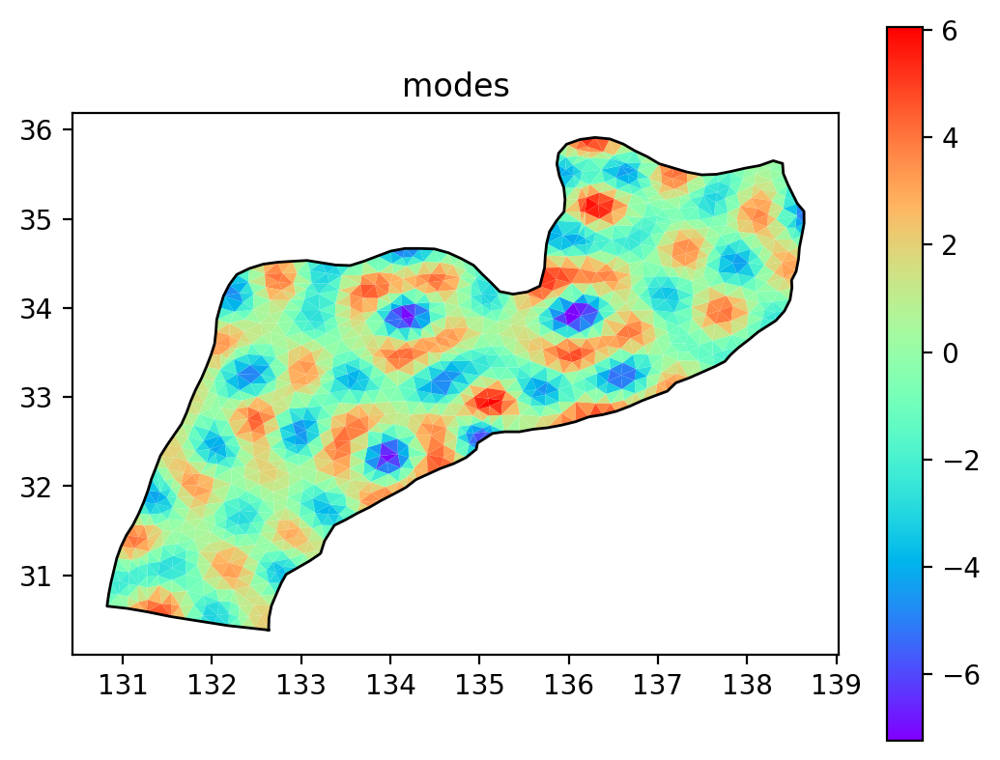

Characteristic Length Scale: 3.027002781037262


(array([166401., 317085., 300013., 234679., 190624., 150459., 112000.,
         67026.,  24176.,   3444.]),
 array([0.03879933, 0.92463366, 1.81046799, 2.69630232, 3.58213664,
        4.46797097, 5.3538053 , 6.23963963, 7.12547396, 8.01130829,
        8.89714262]),
 <BarContainer object of 10 artists>)

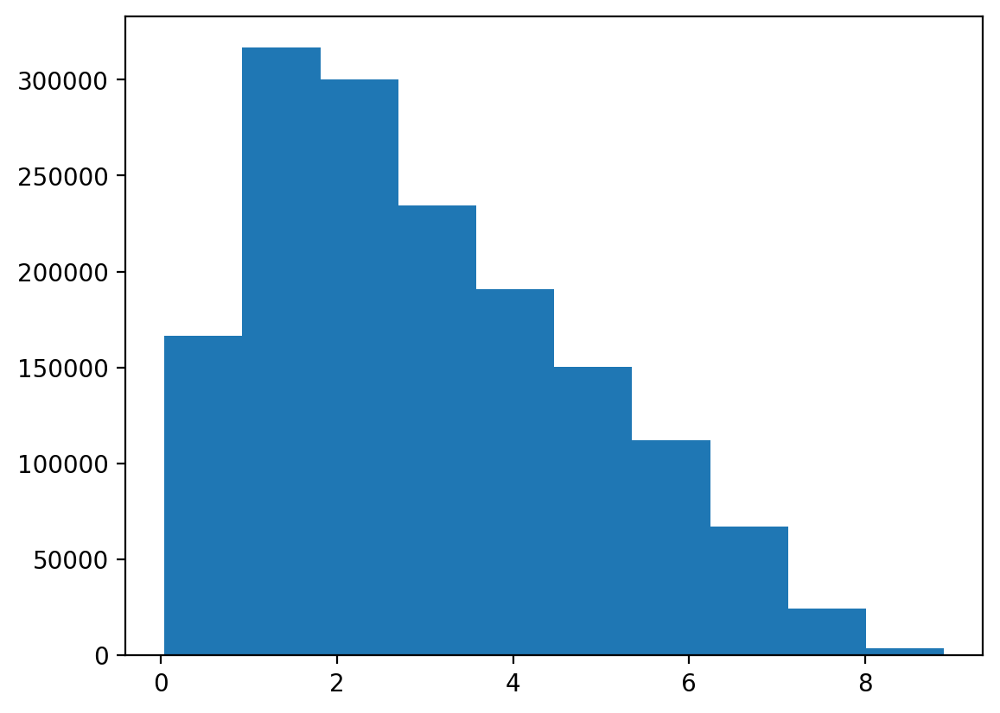

In [22]:
asdf = operators.eigenvectors_to_tde_slip[0][1::2, -1]

plot_mesh(meshes[0], 100 * asdf, plt.gca())
plt.title("modes")
plt.show()

import numpy as np
from scipy.spatial.distance import pdist, squareform

# points = np.array([
#     [x1, y1],
#     [x2, y2],
#     # ...
# ])

points = np.vstack((meshes[0].lon_centroid, meshes[0].lat_centroid))

# Corresponding scalar values at these points
scalars = np.array(asdf)

# Step 1: Calculate pairwise Euclidean distances between points
distances = pdist(points.T)  # Returns a 1D array of pairwise distances
dist_matrix = squareform(distances)  # Convert to a 2D symmetric matrix

# Step 2: Calculate pairwise differences in scalar values
scalar_diffs = pdist(scalars[:, None])  # Scalar differences for each pair
scalar_diff_matrix = squareform(scalar_diffs)  # Convert to 2D matrix

# Step 3: Compute the average length scale
# Define a threshold (e.g., 1/e of max scalar difference)
threshold = np.max(scalar_diff_matrix) / np.e

# Get distances where scalar difference is below threshold
length_scale_distances = distances[scalar_diffs <= threshold]

# Calculate the characteristic length scale as the average of these distances
characteristic_length_scale = np.mean(length_scale_distances)

print("Characteristic Length Scale:", characteristic_length_scale)

plt.hist(length_scale_distances)

In [23]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.signal import find_peaks


def average_peak_to_peak_distance(x, y, s):
    # Step 1: Identify peaks in scalar values s
    peaks, _ = find_peaks(s)

    # Step 2: Select coordinates of the peaks
    peak_coords = np.column_stack((x[peaks], y[peaks]))

    # Step 3: Compute pairwise Euclidean distances between peaks
    distances = pdist(peak_coords, metric="euclidean")
    distance_matrix = squareform(distances)

    # Step 4: For each peak, find the distance to the closest other peak
    np.fill_diagonal(distance_matrix, np.inf)  # Ignore self-distances
    min_distances = np.min(distance_matrix, axis=1)

    # Step 5: Calculate the average of these minimum distances
    avg_peak_to_peak_distance = np.mean(min_distances)

    return avg_peak_to_peak_distance


avg_distance = average_peak_to_peak_distance(
    meshes[0].lon_centroid, meshes[0].lat_centroid, asdf
)
print("Average peak-to-peak distance:", avg_distance)

Average peak-to-peak distance: 0.1011871290144066


In [24]:
import numpy as np
from scipy.interpolate import griddata
from scipy.fft import fft2, fftshift

x = meshes[0].lon_centroid
y = meshes[0].lat_centroid
x_min = np.min(x)
y_min = np.min(y)
x_max = np.max(x)
y_max = np.max(y)


# Example input data: irregularly spaced points and corresponding scalar values
# Coordinates and scalar values at each point
# points = np.array([[x1, y1], [x2, y2], ...])
scalars = asdf

# Step 1: Resample data onto a regular grid
# Define grid dimensions and range
grid_x, grid_y = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
grid_scalars = griddata(points.T, scalars, (grid_x, grid_y), method="cubic")
grid_scalars[np.isnan(grid_scalars)] = 0

# Step 2: Apply 2D Fourier Transform to the gridded data
ft = fft2(grid_scalars, norm="ortho")
ft_shifted = fftshift(ft)  # Shift zero frequency to center for visualization

# Step 3: Calculate the power spectrum (magnitude of the Fourier coefficients)
power_spectrum = np.abs(ft_shifted) ** 2

# Step 4: Identify the dominant spatial frequency
# Find the frequency with the maximum power in the spectrum
ny, nx = power_spectrum.shape
freq_x = np.fft.fftfreq(nx, d=(x_max - x_min) / nx)
freq_y = np.fft.fftfreq(ny, d=(y_max - y_min) / ny)
fx, fy = np.meshgrid(freq_x, freq_y)

# Get indices of the maximum power value (excluding zero frequency)
max_power_idx = np.unravel_index(np.argmax(power_spectrum[1:]), power_spectrum.shape)

# Convert the dominant frequency to a characteristic length scale
dominant_frequency = np.sqrt(fx[max_power_idx] ** 2 + fy[max_power_idx] ** 2)
characteristic_length_scale = 1 / dominant_frequency

print("Characteristic Length Scale:", characteristic_length_scale)

Characteristic Length Scale: 0.09190498536465525


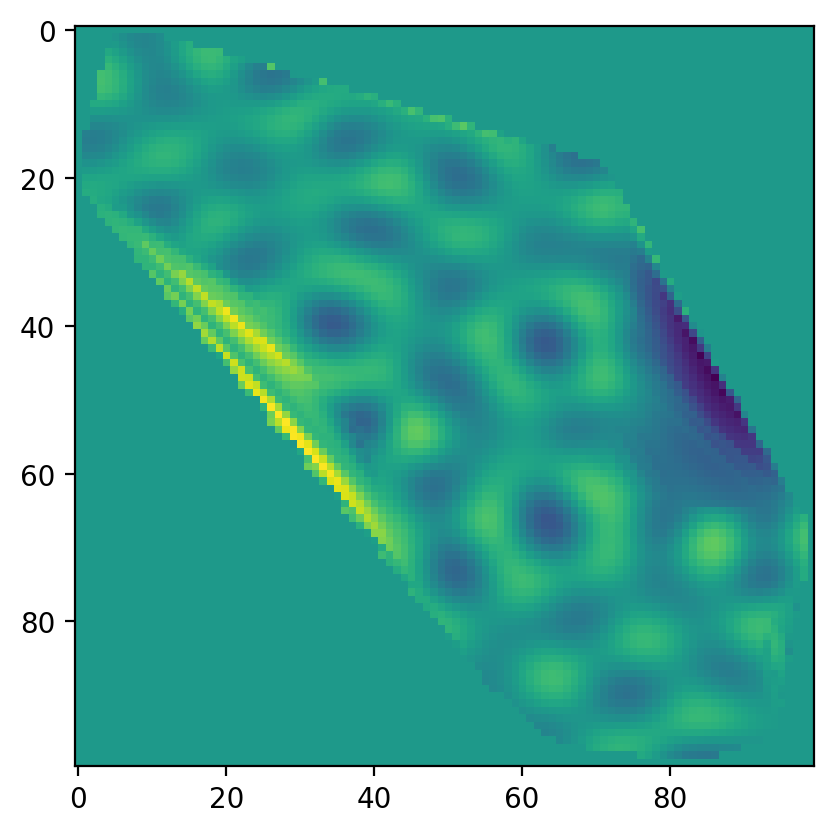

In [25]:
plt.imshow(grid_scalars)

In [26]:
# if iterate_for_coupling_bounds == True:
#     while iterate_for_coupling_bounds == True:
#         # QP solve
# Get QP bounds as inequality constraints
# qp_inequality_constraints_matrix, qp_inequality_constraints_data_vector = (
#     celeri.get_qp_all_inequality_operator_and_data_vector(
#         index, meshes, operators, segment, block
#     )
# )

# # QP solve
# opts = {"show_progress": True}
# solution_qp = celeri.lsqlin_qp(
#     operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
#     data_vector_eigen * np.sqrt(weighting_vector_eigen),
#     0,
#     qp_inequality_constraints_matrix,  # Inequality matrix
#     qp_inequality_constraints_data_vector,  # Inequality data vector
#     None,
#     None,
#     None,
#     None,
#     None,
#     opts,
# )


# # Create estimation data structure and calculate derived quantities
# estimation_qp = addict.Dict()
# estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
# estimation_qp.operator = operators.eigen
#         estimation_qp = 0

#         # Check coupling bounds
#         iterate_for_coupling_bounds = check_coupling_bounds(meshes, estimation_qp)